# XENON1T multi-event noise analysis

_[Dominick C.][cichon], March 2016_

Abstract: Under construction.

[cichon]: https://xecluster.lngs.infn.it/dokuwiki/doku.php?id=cichon_localhost

In [1]:
# make button for code hiding
from hax.ipython import code_hider

code_hider()

/archive_lngs/common/anaconda3/envs/pax440r5/lib/python3.4/site-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)
 In case you run from a remote ssh session, reconnect with ssh -Y


# Table of Contents
 <p><div class="lev1"><a href="#XENON1T-multi-event-noise-analysis"><span class="toc-item-num">1 - </span>XENON1T multi-event noise analysis</a></div><div class="lev2"><a href="#Introduction"><span class="toc-item-num">1.1 - </span>Introduction</a></div><div class="lev2"><a href="#Dataset"><span class="toc-item-num">1.2 - </span>Dataset</a></div><div class="lev2"><a href="#Setting-up-the-analysis"><span class="toc-item-num">1.3 - </span>Setting up the analysis</a></div><div class="lev2"><a href="#First-look-at-amplitude-spectrum"><span class="toc-item-num">1.4 - </span>First look at amplitude spectrum</a></div><div class="lev3"><a href="#Figure-01:-Amplitude-spectrum-(averaged-over-all-channels-and-events,-different-zoom-levels)"><span class="toc-item-num">1.4.1 - </span>Figure 01: Amplitude spectrum (averaged over all channels and events, different zoom levels)</a></div><div class="lev3"><a href="#Figure-02:-Evolution-of-amplitude-spectrum-(averaged-over-all-channels,-different-zoom-levels)"><span class="toc-item-num">1.4.2 - </span>Figure 02: Evolution of amplitude spectrum (averaged over all channels, different zoom levels)</a></div><div class="lev2"><a href="#Noise-spectrum-averages-/-standard-deviations-(over-all-events)"><span class="toc-item-num">1.5 - </span>Noise spectrum averages / standard deviations (over all events)</a></div><div class="lev3"><a href="#Figure-03:-Average-amplitude-and-phase-spectra"><span class="toc-item-num">1.5.1 - </span>Figure 03: Average amplitude and phase spectra</a></div><div class="lev3"><a href="#Figure-04:-Average-amplitude-and-phase-spectra-(zoomed-in)"><span class="toc-item-num">1.5.2 - </span>Figure 04: Average amplitude and phase spectra (zoomed in)</a></div><div class="lev3"><a href="#Figure-05:-Standard-deviations-of-FFT-coefficient-parameters"><span class="toc-item-num">1.5.3 - </span>Figure 05: Standard deviations of FFT coefficient parameters</a></div><div class="lev3"><a href="#Figure-06:-Standard-deviations-of-FFT-coefficient-parameters-(zoomed-in)"><span class="toc-item-num">1.5.4 - </span>Figure 06: Standard deviations of FFT coefficient parameters (zoomed in)</a></div>

## Introduction
Using the same techniques as for the [XENON100 multi-event noise analysis][xe100_analysis], the noise spectra of long baseline data with a window length of 800 µs are combined and analyzed in order to pinpoint possible noise sources.

[xe100_analysis]: https://xecluster.lngs.infn.it/dokuwiki/lib/exe/fetch.php?media=xenon:xenon1t:analysis:dominick:noise_frequency_cont.html

## Dataset
|commissioning run|name         |events|events used|window length|ZLE|HV|
|-----------------|-------------|------|-----------|-------------|---|--|
|25               |`160226_1218`|305   |first 40   |800 µs       |no |on|
    
## Setting up the analysis
Before calculating the FFTs, some cross-checks are made to test the dataset quality. More specifically, each event is tested for having a single pulse for each channel which is exactly 800 µs long.

In [1]:
# standard library imports
from os.path import join

# third party imports
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import tables as tb
from tqdm import tqdm

# pax imports
from pax import core
from pax.configuration import load_configuration
from pax.plugins.io.BSON import DecodeZBSON

# magic function to enable inline plots (i.e. plots appear in the notebook itself)
%matplotlib inline

# set global plotting options
plt.rcParams["font.size"] = 20
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (8, 6)

# set basic path constants for easier path changes if needed
BASE_PATH = "/home/cichon/xenon1t/analysis/noise_frequency"
DATA_BASE_PATH = "/archive_lngs100TB/common/daqtest/xenon1t"

# define file path constants for later use
DATA_PATH = join(DATA_BASE_PATH, "160226_1218")

# set up pytables filter for compression
FILTERS = tb.Filters(complib='zlib')

# set up PAX facilities (ignore the warning in the output)
CUSTOM_CONFIG = {"pax": {"plugin_group_names": ["input"],
                 "input": "Zip.ReadZipped",
                 "input_name": DATA_PATH}}
pax_config = load_configuration(config_names="XENON100", config_dict=CUSTOM_CONFIG)
custom_pax = core.Processor(config_names="XENON100", config_dict=CUSTOM_CONFIG)
bson_decoder = DecodeZBSON(pax_config["DEFAULT"], custom_pax)

/archive_lngs/common/anaconda3/envs/pax440r5/lib/python3.4/site-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


In [2]:
# get first event to extract information about sample length
event_generator = custom_pax.get_events()
event_proxy = next(event_generator)
event = bson_decoder.transform_event(event_proxy)
pulse = event.pulses[0]

# constant definitions
LEN_DATA = len(pulse.raw_data)
LEN_PADDED = 2**(int(np.log2(LEN_DATA)) + 1)
FREQS_PADDED = np.fft.rfftfreq(LEN_PADDED, 1e-8)

In [3]:
# dataset quality check
event_generator = custom_pax.get_events()
pulse_num = []
pulse_len = []

for event_proxy in event_generator:
    event = bson_decoder.transform_event(event_proxy)
    pulse_num.append(len(event.pulses))
    
    for pulse in event.pulses:
        pulse_len.append(len(pulse.raw_data))

pulse_num = np.array(pulse_num)
pulse_len = np.array(pulse_len)
print("Number of events:", len(pulse_num))
print("Maximum number of pulses in an event:", pulse_num.max())
print("Number of events with maximum number of pulses:", len(pulse_num[pulse_num==pulse_num.max()]))
print("Maximum pulse length:", pulse_len.max())
print("Number of pulses with maximum length:", len(pulse_len[pulse_len==pulse_len.max()]))

Number of events: 305
Maximum number of pulses in an event: 254
Number of events with maximum number of pulses: 305
Maximum pulse length: 80000
Number of pulses with maximum length: 77470


As it can be seen in the output above, the dataset seems to be fine. Because of the huge amount of FFT coefficients calculated, resulting in a correspondingly huge amount of storage space needed, only the first 40 events are being looked at.

In [4]:
# define pytables column descriptions
class FftCoeffs(tb.IsDescription):
    event_nr = tb.UInt32Col()
    event_time = tb.UInt64Col()
    channel_nr = tb.UInt16Col()
    coeffs = tb.ComplexCol(16, shape=len(FREQS_PADDED))
    amplitudes = tb.FloatCol(8, shape=len(FREQS_PADDED))
    phases = tb.ComplexCol(16, shape=len(FREQS_PADDED))
    phases_raw = tb.ComplexCol(16, shape=len(FREQS_PADDED))
    phases_custom = tb.ComplexCol(16, shape=len(FREQS_PADDED))

# prepare HDF5 file
FFT_DATA_PATH = join(BASE_PATH, "output/fft_data_xenon1t_160226_1218.h5")

try:
    data_file = tb.open_file(FFT_DATA_PATH, mode = "r", filters=FILTERS)
    coeffs_table = data_file.get_node("/fft_coeffs")
    process_new = False
except (OSError, FileNotFoundError, ValueError, tb.NodeError):
    data_file = tb.open_file(FFT_DATA_PATH, mode = "w", filters=FILTERS)
    coeffs_table = data_file.create_table("/", "fft_coeffs", FftCoeffs)
    process_new = True

In [5]:
# calculate FFT (with average subtraction, Blackman window and zero padding) for all events
# also, determine event start times relative to first event
valid_events = 0
set_continue = False

if process_new:
    event_generator = custom_pax.get_events()

    for event_nr, event_proxy in enumerate(tqdm(event_generator)):
        # only use first 40 valid events due to storage file growing too big otherwise
        if valid_events >= 40:
            break

        event = bson_decoder.transform_event(event_proxy)
        
        # skip event if not all PMTs have a full pulse
        if len(event.pulses) != pulse_num.max():
            continue
        
        for pulse in event.pulses:
            if len(pulse.raw_data) != pulse_len.max():
                set_continue = True
                break
        
        if set_continue:
            set_continue = False
            continue

        if valid_events == 0:
            start_time_first_ev = event.start_time

        for channel_nr, pulse in enumerate(event.pulses):
            # set FFT metadata
            coeffs_table.row["event_nr"] = valid_events
            coeffs_table.row["event_time"] = event.start_time - start_time_first_ev
            coeffs_table.row["channel_nr"] = channel_nr

            # calculate FFT
            raw_data_avg = np.average(pulse.raw_data) - pulse.raw_data
            raw_data_win = np.blackman(LEN_DATA) * raw_data_avg
            coeffs_table.row["coeffs"] = np.fft.rfft(raw_data_win, n=LEN_PADDED) / LEN_PADDED       

            # calculate amplitudes, phases and corrected phases
            # also correct FFT coefficients
            coeffs_table.row["amplitudes"] = np.abs(coeffs_table.row["coeffs"])
            coeffs_table.row["phases_raw"] = np.exp(complex(0, 1)*np.angle(coeffs_table.row["coeffs"]))
            coeffs_table.row["phases"] = (coeffs_table.row["phases_raw"] *
                                          np.exp(complex(0, -1)*2*np.pi*np.mod(FREQS_PADDED*1e-9 *
                                                                               coeffs_table.row["event_time"], 1)))
            coeffs_table.row["phases_custom"] = (coeffs_table.row["phases_raw"] *
                                                 np.exp(complex(0, -1)*2*np.pi*np.mod(2.0825*1e-4 *
                                                                                      coeffs_table.row["event_time"], 1)))
            coeffs_table.row["coeffs"] *= np.exp(complex(0, -1)*2*np.pi*np.mod(FREQS_PADDED*1e-9 *
                                                                               coeffs_table.row["event_time"], 1))
            coeffs_table.row.append()

            # free memory
            del raw_data_avg
            del raw_data_win

        # flush after each event
        coeffs_table.flush()
        valid_events += 1

    # create table indices for HUGE reading speed improvement
    coeffs_table.cols.event_nr.create_index()
    print("Finished creating event number index.")
    coeffs_table.cols.channel_nr.create_index()
    print("Finished creating channel number index.")
    coeffs_table.flush()

    # free memory
    del event_generator
    del event

40it [29:02, 45.89s/it]

Finished creating event number index.
Finished creating channel number index.


In [6]:
# get event and channel indices
events = list(set(coeffs_table.read(field="event_nr")))
events.sort()
channels = list(set(coeffs_table.read(field="channel_nr")))
channels.sort()

# specify data paths
AMPL_CH_MEAN_PATH = join(BASE_PATH, "output/ampl_ch_mean_xenon1t_160226_1218.dat")

COEFFS_AVG_PATH = join(BASE_PATH, "output/coeffs_avg_xenon1t_160226_1218.dat")
COEFFS_STD_PATH = join(BASE_PATH, "output/coeffs_std_xenon1t_160226_1218.dat")

AMPL_MEAN_PATH = join(BASE_PATH, "output/ampl_mean_xenon1t_160226_1218.dat")
AMPL_STD_PATH = join(BASE_PATH, "output/ampl_std_xenon1t_160226_1218.dat")

PHASE_MEAN_PATH = join(BASE_PATH, "output/phase_mean_xenon1t_160226_1218.dat")
PHASE_VAR_PATH = join(BASE_PATH, "output/phase_var_xenon1t_160226_1218.dat")

PHASE_RAW_MEAN_PATH = join(BASE_PATH, "output/phase_raw_mean_xenon1t_160226_1218.dat")
PHASE_RAW_VAR_PATH = join(BASE_PATH, "output/phase_raw_var_xenon1t_160226_1218.dat")

PHASE_CUSTOMCORR_MEAN_PATH = join(BASE_PATH, "output/phase_customcorr_mean_xenon1t_160226_1218.dat")
PHASE_CUSTOMCORR_VAR_PATH = join(BASE_PATH, "output/phase_customcorr_var_xenon1t_160226_1218.dat")

# calculate mean amplitude spectrum over all channels for each event
try:
    ampl_ch_mean = np.memmap(AMPL_CH_MEAN_PATH, dtype=np.float32, mode="r", shape=(len(events), len(FREQS_PADDED)))
except (FileNotFoundError, ValueError):
    ampl_ch_mean = np.memmap(AMPL_CH_MEAN_PATH, dtype=np.float32, mode="w+", shape=(len(events), len(FREQS_PADDED)))

    for event_nr in tqdm(events):
        np.nanmean(coeffs_table.read_where("event_nr == {}".format(event_nr), field="amplitudes"), 0,
                   out=ampl_ch_mean[event_nr])

# calculate mean/standard deviation of coefficient/amplitude/phase spectrum over all events for each channel
try:
    coeffs_avg = np.memmap(COEFFS_AVG_PATH, dtype=np.complex128, mode="r", shape=(len(channels), len(FREQS_PADDED)))
    coeffs_std = np.memmap(COEFFS_STD_PATH, dtype=np.float64, mode="r", shape=(len(channels), len(FREQS_PADDED)))
    
    ampl_mean = np.memmap(AMPL_MEAN_PATH, dtype=np.float64, mode="r", shape=(len(channels), len(FREQS_PADDED)))
    ampl_std = np.memmap(AMPL_STD_PATH, dtype=np.float64, mode="r", shape=(len(channels), len(FREQS_PADDED)))
    
    phases_mean = np.memmap(PHASE_MEAN_PATH, dtype=np.complex128, mode="r", shape=(len(channels), len(FREQS_PADDED)))
    phases_var = np.memmap(PHASE_VAR_PATH, dtype=np.float64, mode="r",shape=(len(channels), len(FREQS_PADDED)))
    
    phases_raw_mean = np.memmap(PHASE_RAW_MEAN_PATH, dtype=np.complex128, mode="r",shape=(len(channels),
                                                                                         len(FREQS_PADDED)))
    phases_raw_var = np.memmap(PHASE_RAW_VAR_PATH, dtype=np.float64, mode="r", shape=(len(channels), len(FREQS_PADDED)))
    
    phases_customcorr_mean = np.memmap(PHASE_CUSTOMCORR_MEAN_PATH, dtype=np.complex128, mode="r",shape=(len(channels),
                                                                                         len(FREQS_PADDED)))
    phases_customcorr_var = np.memmap(PHASE_CUSTOMCORR_VAR_PATH, dtype=np.float64, mode="r", shape=(len(channels),
                                                                                                     len(FREQS_PADDED)))
except (FileNotFoundError, ValueError):
    coeffs_avg = np.memmap(COEFFS_AVG_PATH, dtype=np.complex128, mode="w+", shape=(len(channels), len(FREQS_PADDED)))
    coeffs_std = np.memmap(COEFFS_STD_PATH, dtype=np.float64, mode="w+", shape=(len(channels), len(FREQS_PADDED)))
    
    ampl_mean = np.memmap(AMPL_MEAN_PATH, dtype=np.float64, mode="w+", shape=(len(channels), len(FREQS_PADDED)))
    ampl_std = np.memmap(AMPL_STD_PATH, dtype=np.float64, mode="w+", shape=(len(channels), len(FREQS_PADDED)))
    
    phases_mean = np.memmap(PHASE_MEAN_PATH, dtype=np.complex128, mode="w+", shape=(len(channels), len(FREQS_PADDED)))
    phases_var = np.memmap(PHASE_VAR_PATH, dtype=np.float64, mode="w+",shape=(len(channels), len(FREQS_PADDED)))
    
    phases_raw_mean = np.memmap(PHASE_RAW_MEAN_PATH, dtype=np.complex128, mode="w+",shape=(len(channels),
                                                                                         len(FREQS_PADDED)))
    phases_raw_var = np.memmap(PHASE_RAW_VAR_PATH, dtype=np.float64, mode="w+", shape=(len(channels), len(FREQS_PADDED)))

    phases_customcorr_mean = np.memmap(PHASE_CUSTOMCORR_MEAN_PATH, dtype=np.complex128, mode="w+",shape=(len(channels),
                                                                                         len(FREQS_PADDED)))
    phases_customcorr_var = np.memmap(PHASE_CUSTOMCORR_VAR_PATH, dtype=np.float64, mode="w+", shape=(len(channels),
                                                                                                     len(FREQS_PADDED)))

    for channel_nr in tqdm(channels):
        data = coeffs_table.read_where("channel_nr == {}".format(channel_nr))

        np.nanmean(data["coeffs"], 0, out=coeffs_avg[channel_nr])
        np.nanstd(data["coeffs"], 0, out=coeffs_std[channel_nr])

        np.nanmean(data["amplitudes"], 0, out=ampl_mean[channel_nr])
        np.nanstd(data["amplitudes"], 0, out=ampl_std[channel_nr])
        
        np.nanmean(data["phases"], 0, out=phases_mean[channel_nr])
        np.nanvar(data["phases"], 0, out=phases_var[channel_nr])

        np.nanmean(data["phases_raw"], 0, out=phases_raw_mean[channel_nr])
        np.nanvar(data["phases_raw"], 0, out=phases_raw_var[channel_nr])
        
        np.nanmean(data["phases_custom"], 0, out=phases_customcorr_mean[channel_nr])
        np.nanvar(data["phases_custom"], 0, out=phases_customcorr_var[channel_nr])

# translate phase factor means / variances into equivalent phases (in periods)
periods_mean = np.mod(np.angle(phases_mean)/(2*np.pi), 1)
periods_std = np.arccos(1-phases_var/2) / (2*np.pi)

periods_raw_mean = np.mod(np.angle(phases_raw_mean)/(2*np.pi), 1)
periods_raw_std = np.arccos(1-phases_raw_var/2) / (2*np.pi)

periods_customcorr_mean = np.mod(np.angle(phases_customcorr_mean)/(2*np.pi), 1)
periods_customcorr_std = np.arccos(1-phases_customcorr_var/2) / (2*np.pi)

## First look at amplitude spectrum

As seen in [Jelle's first look at long-baseline XENON1T data][xe1t_jelle], two noise components which are already known from the [XENON100 multi-event noise analysis][xe100_analysis] return (Fig. 01):
* 25 kHz (sinusoidal noise)
* multiples of approx. 207-208 kHz (delta noise, very likely from HV module)

In addition, some other features can be made out:
* broad peak at approx. 700 kHz
* even broader peak between 2.5 MHz and 3 MHz
* faint peak at about 600 kHz (will be important later on)

[xe100_analysis]: https://xecluster.lngs.infn.it/dokuwiki/lib/exe/fetch.php?media=xenon:xenon1t:analysis:dominick:noise_frequency_cont.html

[xe1t_jelle]: https://xecluster.lngs.infn.it/dokuwiki/lib/exe/fetch.php?media=xenon:xenon1t:aalbers:first_look_x1t_noise_update.html

### Figure 01: Amplitude spectrum (averaged over all channels and events, different zoom levels)

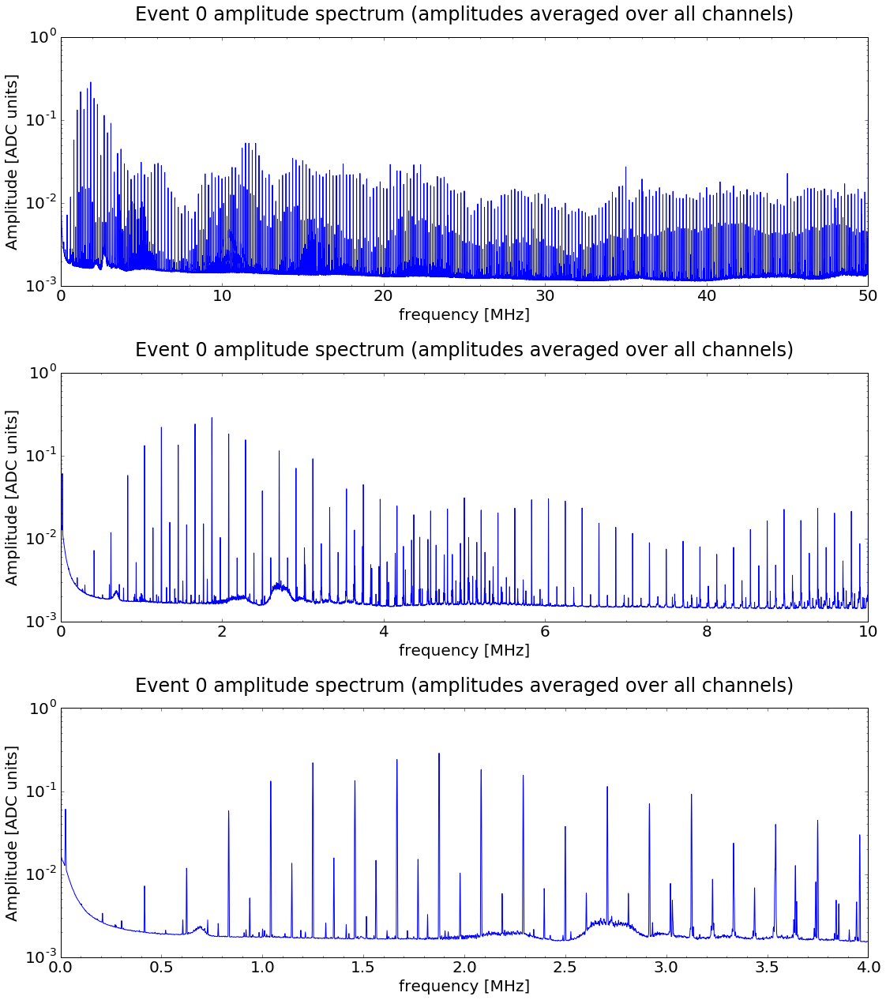

In [7]:
# calculate mean over all events
ampl_ch_ev_mean = np.mean(ampl_ch_mean, 0)

# make spectrum plots
fig_avg, axes_avg = plt.subplots(figsize=(16, 18), nrows=3, ncols=1)
avg_plot_1 = axes_avg[0].plot(FREQS_PADDED/1e6, ampl_ch_ev_mean)
axes_avg[0].set_xlim(0, 50)
axes_avg[0].set_ylim(1e-3, 1)
axes_avg[0].set_yscale("log")
axes_avg[0].set_title("Event 0 amplitude spectrum (amplitudes averaged over all channels)", y=1.05)
axes_avg[0].set_xlabel("frequency [MHz]")
axes_avg[0].set_ylabel("Amplitude [ADC units]")
axes_avg[0].minorticks_on()

avg_plot_2 = axes_avg[1].plot(FREQS_PADDED/1e6, ampl_ch_ev_mean)
axes_avg[1].set_xlim(0, 10)
axes_avg[0].set_ylim(1e-3, 1)
axes_avg[1].set_yscale("log")
axes_avg[1].set_title("Event 0 amplitude spectrum (amplitudes averaged over all channels)", y=1.05)
axes_avg[1].set_xlabel("frequency [MHz]")
axes_avg[1].set_ylabel("Amplitude [ADC units]")
axes_avg[1].minorticks_on()

avg_plot_3 = axes_avg[2].plot(FREQS_PADDED/1e6, ampl_ch_ev_mean)
axes_avg[2].set_xlim(0, 4)
axes_avg[2].set_ylim(1e-3, 1)
axes_avg[2].set_yscale("log")
axes_avg[2].set_title("Event 0 amplitude spectrum (amplitudes averaged over all channels)", y=1.05)
axes_avg[2].set_xlabel("frequency [MHz]")
axes_avg[2].set_ylabel("Amplitude [ADC units]")
axes_avg[2].minorticks_on()

fig_avg.tight_layout()

### Figure 02: Evolution of amplitude spectrum (averaged over all channels, different zoom levels)

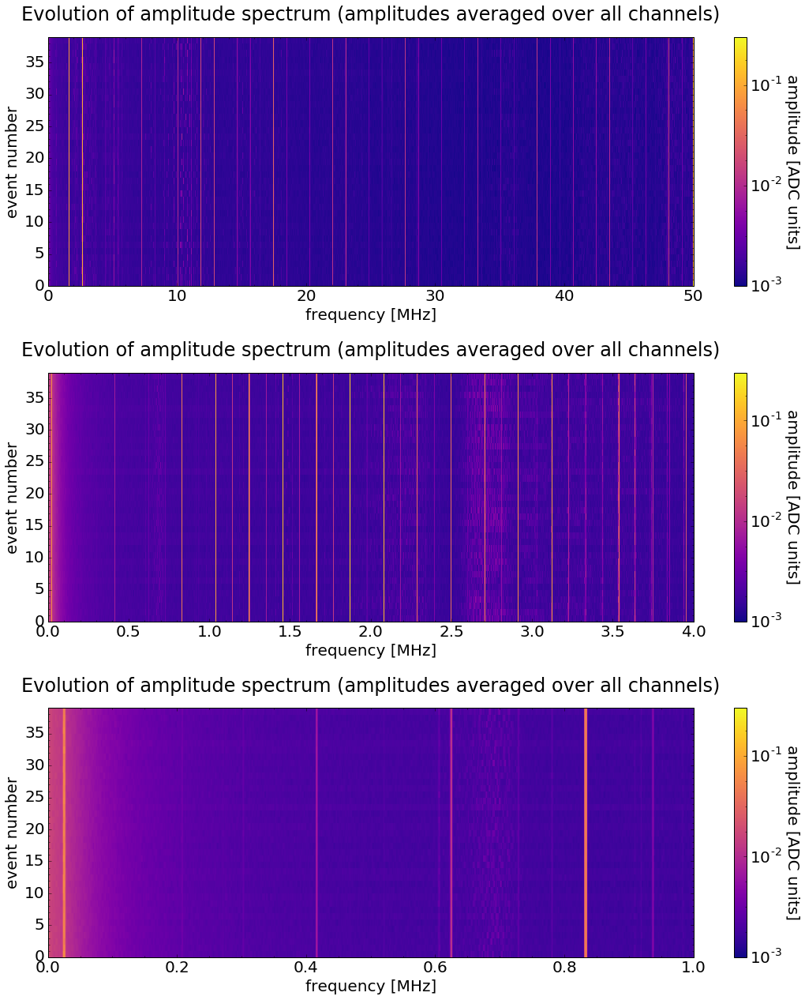

In [8]:
# set up grid points for plotting
SPECTR_X1, SPECTR_Y1 = np.meshgrid(FREQS_PADDED/1e6, np.arange(0, len(channels)))
SPECTR_X2, SPECTR_Y2 = np.meshgrid(FREQS_PADDED/1e6, np.arange(0, len(events)))

# make evolution plots
fig_avg_evol, axes_avg_evol = plt.subplots(figsize=(16, 18), nrows=3, ncols=1)
avg_evol_plot_1 = axes_avg_evol[0].pcolormesh(SPECTR_X2, SPECTR_Y2, ampl_ch_mean, cmap=mpl.cm.plasma,
                                              norm=mpl.colors.LogNorm(), vmin=1e-3, vmax=3e-1)
axes_avg_evol[0].set_xlim(0, 50)
axes_avg_evol[0].set_ylim(0, 39)
avg_evol_1_cbar = fig_avg_evol.colorbar(avg_evol_plot_1, ax=axes_avg_evol[0])
axes_avg_evol[0].set_title("Evolution of amplitude spectrum (amplitudes averaged over all channels)", y=1.05)
axes_avg_evol[0].set_xlabel("frequency [MHz]")
axes_avg_evol[0].set_ylabel("event number")
axes_avg_evol[0].minorticks_on()
avg_evol_1_cbar.set_label("amplitude [ADC units]", labelpad=22, rotation=270)
avg_evol_1_cbar.ax.minorticks_on()

avg_evol_plot_2 = axes_avg_evol[1].pcolormesh(SPECTR_X2, SPECTR_Y2, ampl_ch_mean, cmap=mpl.cm.plasma,
                                              norm=mpl.colors.LogNorm(), vmin=1e-3, vmax=3e-1)
axes_avg_evol[1].set_xlim(0, 4)
axes_avg_evol[1].set_ylim(0, 39)
avg_evol_2_cbar = fig_avg_evol.colorbar(avg_evol_plot_2, ax=axes_avg_evol[1])
axes_avg_evol[1].set_title("Evolution of amplitude spectrum (amplitudes averaged over all channels)", y=1.05)
axes_avg_evol[1].set_xlabel("frequency [MHz]")
axes_avg_evol[1].set_ylabel("event number")
axes_avg_evol[1].minorticks_on()
avg_evol_2_cbar.set_label("amplitude [ADC units]", labelpad=22, rotation=270)
avg_evol_2_cbar.ax.minorticks_on()

avg_evol_plot_3 = axes_avg_evol[2].pcolormesh(SPECTR_X2, SPECTR_Y2, ampl_ch_mean, cmap=mpl.cm.plasma,
                                              norm=mpl.colors.LogNorm(), vmin=1e-3, vmax=3e-1)
axes_avg_evol[2].set_xlim(0, 1)
axes_avg_evol[2].set_ylim(0, 39)
avg_evol_3_cbar = fig_avg_evol.colorbar(avg_evol_plot_3, ax=axes_avg_evol[2])
axes_avg_evol[2].set_title("Evolution of amplitude spectrum (amplitudes averaged over all channels)", y=1.05)
axes_avg_evol[2].set_xlabel("frequency [MHz]")
axes_avg_evol[2].set_ylabel("event number")
axes_avg_evol[2].minorticks_on()
avg_evol_3_cbar.set_label("amplitude [ADC units]", labelpad=22, rotation=270)
avg_evol_3_cbar.ax.minorticks_on()

fig_avg_evol.tight_layout()

## Noise spectrum averages / standard deviations (over all events)
In contrast to XENON100 data, there seem to be no noise components which are limited to certain channel ranges only (Fig. 03 and 04, upper halves). In addition, no phase correlation can be made out when combining events (Fig. 03 and 04, lower halves).

### Figure 03: Average amplitude and phase spectra

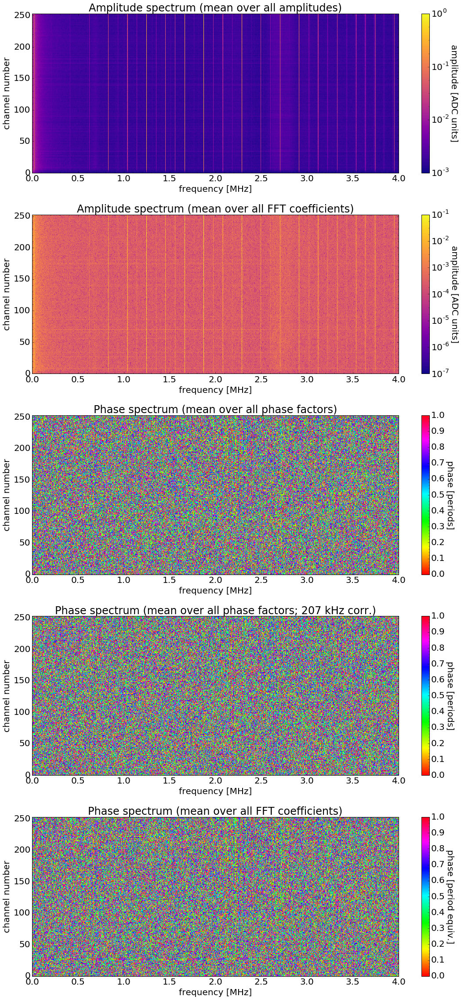

In [9]:
# make mean value plots
fig_coeffs, axes_coeffs = plt.subplots(figsize=(16, 32), nrows=5, ncols=1)

coeffs_amplplot_meanlast = axes_coeffs[0].pcolormesh(SPECTR_X1, SPECTR_Y1, ampl_mean, cmap=mpl.cm.plasma,
                                                     norm=mpl.colors.LogNorm(), vmin=1e-3, vmax=1)
coeffs_amplplot_meanlast_cbar = fig_coeffs.colorbar(coeffs_amplplot_meanlast, ax=axes_coeffs[0])
axes_coeffs[0].set_xlim(0, 4)
axes_coeffs[0].set_ylim(0, 253)
axes_coeffs[0].set_title("Amplitude spectrum (mean over all amplitudes)")
axes_coeffs[0].set_xlabel("frequency [MHz]")
axes_coeffs[0].set_ylabel("channel number")
axes_coeffs[0].minorticks_on()
coeffs_amplplot_meanlast_cbar.set_label("amplitude [ADC units]", labelpad=20, rotation=270)
coeffs_amplplot_meanlast_cbar.ax.minorticks_on()

coeffs_amplplot_meanfirst = axes_coeffs[1].pcolormesh(SPECTR_X1, SPECTR_Y1, np.abs(coeffs_avg),
                                                      cmap=mpl.cm.plasma, norm=mpl.colors.LogNorm(), vmin=1e-7, vmax=1e-1)
coeffs_amplplot_meanfirst_cbar = fig_coeffs.colorbar(coeffs_amplplot_meanfirst, ax=axes_coeffs[1])
axes_coeffs[1].set_xlim(0, 4)
axes_coeffs[1].set_ylim(0, 253)
axes_coeffs[1].set_title("Amplitude spectrum (mean over all FFT coefficients)")
axes_coeffs[1].set_xlabel("frequency [MHz]")
axes_coeffs[1].set_ylabel("channel number")
axes_coeffs[1].minorticks_on()
coeffs_amplplot_meanfirst_cbar.set_label("amplitude [ADC units]", labelpad=20, rotation=270)
coeffs_amplplot_meanfirst_cbar.ax.minorticks_on()

coeffs_phaseplot_meanlast = axes_coeffs[2].pcolormesh(SPECTR_X1, SPECTR_Y1, periods_mean, cmap=mpl.cm.hsv, vmin=0,
                                                      vmax=1)
coeffs_phaseplot_meanlast_cbar = fig_coeffs.colorbar(coeffs_phaseplot_meanlast, ax=axes_coeffs[2])
axes_coeffs[2].set_xlim(0, 4)
axes_coeffs[2].set_ylim(0, 253)
axes_coeffs[2].set_title("Phase spectrum (mean over all phase factors)")
axes_coeffs[2].set_xlabel("frequency [MHz]")
axes_coeffs[2].set_ylabel("channel number")
axes_coeffs[2].minorticks_on()
coeffs_phaseplot_meanlast_cbar.set_label("phase [periods]", labelpad=20, rotation=270)
coeffs_phaseplot_meanlast_cbar.ax.minorticks_on()

coeffs_phaseplot_custom = axes_coeffs[3].pcolormesh(SPECTR_X1, SPECTR_Y1, periods_customcorr_mean, cmap=mpl.cm.hsv, vmin=0,
                                                    vmax=1)
coeffs_phaseplot_custom_cbar = fig_coeffs.colorbar(coeffs_phaseplot_custom, ax=axes_coeffs[3])
axes_coeffs[3].set_xlim(0, 4)
axes_coeffs[3].set_ylim(0, 253)
axes_coeffs[3].set_title("Phase spectrum (mean over all phase factors; 207 kHz corr.)")
axes_coeffs[3].set_xlabel("frequency [MHz]")
axes_coeffs[3].set_ylabel("channel number")
axes_coeffs[3].minorticks_on()
coeffs_phaseplot_custom_cbar.set_label("phase [periods]", labelpad=20, rotation=270)
coeffs_phaseplot_custom_cbar.ax.minorticks_on()

coeffs_phaseplot_meanfirst = axes_coeffs[4].pcolormesh(SPECTR_X1, SPECTR_Y1,
                                                       np.mod(np.angle(coeffs_avg)/(2*np.pi), 1), cmap=mpl.cm.hsv,
                                                       vmin=0, vmax=1)
coeffs_phaseplot_meanfirst_cbar = fig_coeffs.colorbar(coeffs_phaseplot_meanfirst, ax=axes_coeffs[4])
axes_coeffs[4].set_xlim(0, 4)
axes_coeffs[4].set_ylim(0, 253)
axes_coeffs[4].set_title("Phase spectrum (mean over all FFT coefficients)")
axes_coeffs[4].set_xlabel("frequency [MHz]")
axes_coeffs[4].set_ylabel("channel number")
axes_coeffs[4].minorticks_on()
coeffs_phaseplot_meanfirst_cbar.set_label("phase [period equiv.]", labelpad=20, rotation=270)
coeffs_phaseplot_meanfirst_cbar.ax.minorticks_on()

fig_coeffs.tight_layout()

### Figure 04: Average amplitude and phase spectra (zoomed in)

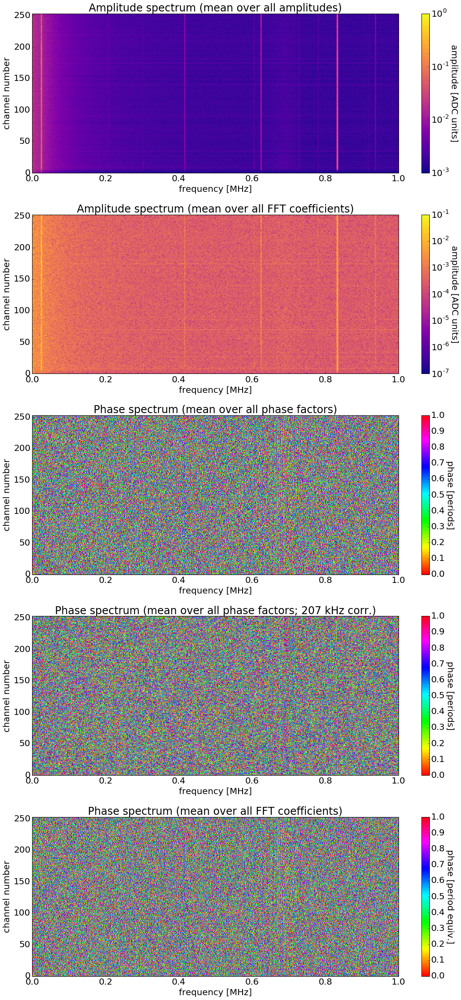

In [10]:
axes_coeffs[0].set_xlim(0, 1)
axes_coeffs[1].set_xlim(0, 1)
axes_coeffs[2].set_xlim(0, 1)
axes_coeffs[3].set_xlim(0, 1)
axes_coeffs[4].set_xlim(0, 1)
fig_coeffs

The standard deviation plots (Fig. 05 and 06) show, that the 25 kHz noise component cannot assumed to be constant. While the multiples of the delta noise line have a lower standard deviation compared to the rest, there seems to be a certain influence of dark pulses (horizontal lines). Except for the uncorrected phase of the 600 kHz line (Fig. 06, bottom), which can thus be assumed to be readout-related, there are no hints of any phase varying less compared to areas without a line.

### Figure 05: Standard deviations of FFT coefficient parameters

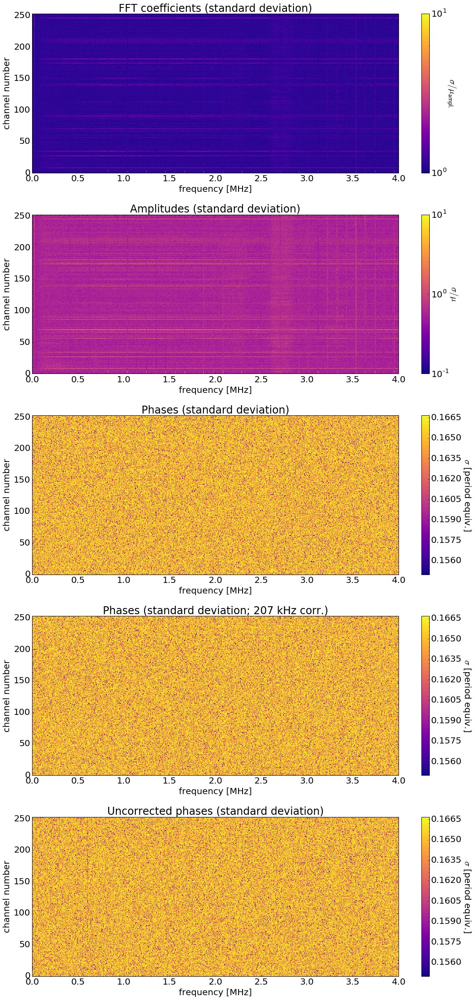

In [11]:
# make standard deviation plots
fig_coeffs_std, axes_coeffs_std = plt.subplots(figsize=(16, 32), nrows=5, ncols=1)

coeffs_coeffplot_std = axes_coeffs_std[0].pcolormesh(SPECTR_X1, SPECTR_Y1, coeffs_std/ampl_mean, cmap=mpl.cm.plasma,
                                                     norm=mpl.colors.LogNorm(), vmin=1, vmax=10)
coeffs_coeffplot_std_cbar = fig_coeffs_std.colorbar(coeffs_coeffplot_std, ax=axes_coeffs_std[0])
axes_coeffs_std[0].set_xlim(0, 4)
axes_coeffs_std[0].set_ylim(0, 253)
axes_coeffs_std[0].set_title("FFT coefficients (standard deviation)")
axes_coeffs_std[0].set_xlabel("frequency [MHz]")
axes_coeffs_std[0].set_ylabel("channel number")
axes_coeffs_std[0].minorticks_on()
coeffs_coeffplot_std_cbar.set_label("$\sigma / \mu_{\mathsf{ampl.}}$", labelpad=23, rotation=270)
coeffs_coeffplot_std_cbar.ax.minorticks_on()

coeffs_amplplot_std = axes_coeffs_std[1].pcolormesh(SPECTR_X1, SPECTR_Y1, ampl_std/ampl_mean, cmap=mpl.cm.plasma,
                                                     norm=mpl.colors.LogNorm(), vmin=1e-1, vmax=10)
coeffs_amplplot_std_cbar = fig_coeffs_std.colorbar(coeffs_amplplot_std, ax=axes_coeffs_std[1])
axes_coeffs_std[1].set_xlim(0, 4)
axes_coeffs_std[1].set_ylim(0, 253)
axes_coeffs_std[1].set_title("Amplitudes (standard deviation)")
axes_coeffs_std[1].set_xlabel("frequency [MHz]")
axes_coeffs_std[1].set_ylabel("channel number")
axes_coeffs_std[1].minorticks_on()
coeffs_amplplot_std_cbar.set_label("$\sigma / \mu$", labelpad=23, rotation=270)
coeffs_amplplot_std_cbar.ax.minorticks_on()

coeffs_phaseplot_std = axes_coeffs_std[2].pcolormesh(SPECTR_X1, SPECTR_Y1, periods_std, cmap=mpl.cm.plasma, vmin=0.155)
coeffs_phaseplot_std_cbar = fig_coeffs_std.colorbar(coeffs_phaseplot_std, ax=axes_coeffs_std[2])
axes_coeffs_std[2].set_xlim(0, 4)
axes_coeffs_std[2].set_ylim(0, 253)
axes_coeffs_std[2].set_title("Phases (standard deviation)")
axes_coeffs_std[2].set_xlabel("frequency [MHz]")
axes_coeffs_std[2].set_ylabel("channel number")
axes_coeffs_std[2].minorticks_on()
coeffs_phaseplot_std_cbar.set_label("$\sigma$ [period equiv.]", labelpad=23, rotation=270)
coeffs_phaseplot_std_cbar.ax.minorticks_on()

coeffs_phaseplot_custom_std = axes_coeffs_std[3].pcolormesh(SPECTR_X1, SPECTR_Y1, periods_customcorr_std, cmap=mpl.cm.plasma,
                                                            vmin=0.155)
coeffs_phaseplot_custom_std_cbar = fig_coeffs_std.colorbar(coeffs_phaseplot_custom_std, ax=axes_coeffs_std[3])
axes_coeffs_std[3].set_xlim(0, 4)
axes_coeffs_std[3].set_ylim(0, 253)
axes_coeffs_std[3].set_title("Phases (standard deviation; 207 kHz corr.)")
axes_coeffs_std[3].set_xlabel("frequency [MHz]")
axes_coeffs_std[3].set_ylabel("channel number")
axes_coeffs_std[3].minorticks_on()
coeffs_phaseplot_custom_std_cbar.set_label("$\sigma$ [period equiv.]", labelpad=23, rotation=270)
coeffs_phaseplot_custom_std_cbar.ax.minorticks_on()

coeffs_phaseplot_raw_std = axes_coeffs_std[4].pcolormesh(SPECTR_X1, SPECTR_Y1, periods_raw_std, cmap=mpl.cm.plasma,
                                                         vmin=0.155)
coeffs_phaseplot_raw_std_cbar = fig_coeffs_std.colorbar(coeffs_phaseplot_raw_std, ax=axes_coeffs_std[4])
axes_coeffs_std[4].set_xlim(0, 4)
axes_coeffs_std[4].set_ylim(0, 253)
axes_coeffs_std[4].set_title("Uncorrected phases (standard deviation)")
axes_coeffs_std[4].set_xlabel("frequency [MHz]")
axes_coeffs_std[4].set_ylabel("channel number")
axes_coeffs_std[4].minorticks_on()
coeffs_phaseplot_raw_std_cbar.set_label("$\sigma$ [period equiv.]", labelpad=23, rotation=270)
coeffs_phaseplot_raw_std_cbar.ax.minorticks_on()

fig_coeffs_std.tight_layout()

### Figure 06: Standard deviations of FFT coefficient parameters (zoomed in)

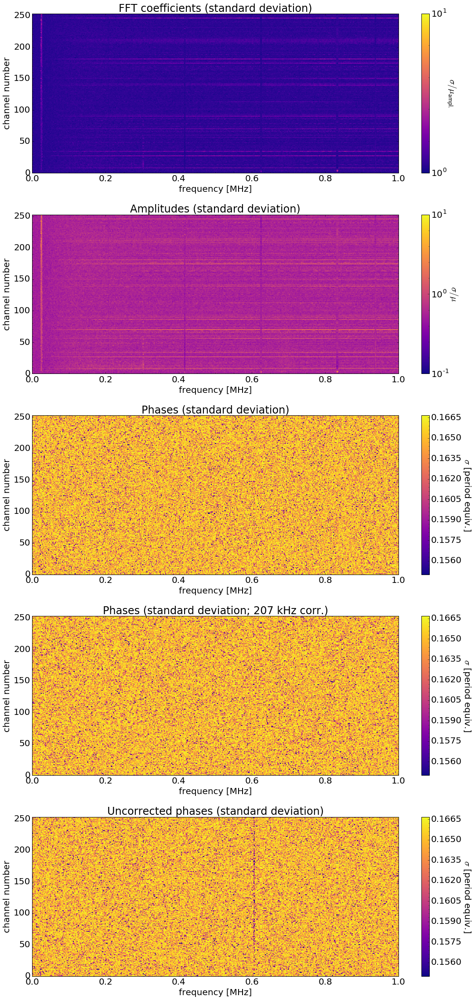

In [12]:
axes_coeffs_std[0].set_xlim(0, 1)
axes_coeffs_std[1].set_xlim(0, 1)
axes_coeffs_std[2].set_xlim(0, 1)
axes_coeffs_std[3].set_xlim(0, 1)
axes_coeffs_std[4].set_xlim(0, 1)
fig_coeffs_std